In [1]:
import os
import pandas as pd
import mne
import numpy as np
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import sys
import argparse
import glob
import json
from matplotlib.ticker import FuncFormatter
import warnings
import re
from scipy import signal
from scipy.stats import zscore
import mne
from mne_bids import BIDSPath, read_raw_bids
import pandas as pd
from pathlib import Path


In [2]:
# Define BIDS path parameters
# OPTION 1: Use absolute path (recommended)
bids_root = '/oceanus/collab//herz-lab/processed_data/bids/MemMapOpenLoop'
subject = 'M1012'
session = '0'
task = 'MemMapOpenLoop'

# Verify the path exists
print(f"Checking BIDS root: {bids_root}")
if not Path(bids_root).exists():
    print(f"ERROR: BIDS root does not exist!")
    print(f"Please update bids_root to the correct path")
    import sys
    sys.exit(1)
else:
    print(f"✓ BIDS root found!")
    print(f"✓ Full path: {Path(bids_root).absolute()}\n")

Checking BIDS root: /oceanus/collab//herz-lab/processed_data/bids/MemMapOpenLoop
✓ BIDS root found!
✓ Full path: /oceanus/collab/herz-lab/processed_data/bids/MemMapOpenLoop



In [3]:
from IPython.display import display, Markdown
display(Markdown(f"# {subject} — {session} — {task}"))


# M1012 — 0 — MemMapOpenLoop

In [4]:
# Option 1: Load iEEG data with associated events
# ============================================================
# IMPORTANT: Specify which referencing scheme to use
acquisition = 'bipolar'  # Change to 'monopolar' if needed

    # Create BIDSPath with acquisition specified
bids_path = BIDSPath(
subject=subject,
session=session,
task=task,
acquisition=acquisition,  # This is REQUIRED to avoid ambiguity
root=bids_root,
datatype='ieeg',
suffix='ieeg',
extension='.edf'  # Explicitly specify file extension
)

print(f"Loading file: {bids_path.fpath}")

# Read the raw data (this will also load events if they exist)
raw = read_raw_bids(bids_path=bids_path, verbose=True)
raw

Loading file: /oceanus/collab/herz-lab/processed_data/bids/MemMapOpenLoop/sub-M1012/ses-0/ieeg/sub-M1012_ses-0_task-MemMapOpenLoop_acq-bipolar_ieeg.edf
Extracting EDF parameters from /oceanus/collab/herz-lab/processed_data/bids/MemMapOpenLoop/sub-M1012/ses-0/ieeg/sub-M1012_ses-0_task-MemMapOpenLoop_acq-bipolar_ieeg.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading events from /oceanus/collab/herz-lab/processed_data/bids/MemMapOpenLoop/sub-M1012/ses-0/ieeg/sub-M1012_ses-0_task-MemMapOpenLoop_events.tsv.
Reading channel info from /oceanus/collab/herz-lab/processed_data/bids/MemMapOpenLoop/sub-M1012/ses-0/ieeg/sub-M1012_ses-0_task-MemMapOpenLoop_acq-bipolar_channels.tsv.


/tmp/ipykernel_397426/212229786.py:21: RuntimeWarning: Limited 48 annotation(s) that were expanding outside the data range.
  raw = read_raw_bids(bids_path=bids_path, verbose=True)
/tmp/ipykernel_397426/212229786.py:21: RuntimeWarning: Expected to find a single electrodes.tsv file associated with sub-M1012_ses-0_task-MemMapOpenLoop_acq-bipolar, but found 2:

/oceanus/collab/herz-lab/processed_data/bids/MemMapOpenLoop/sub-M1012/ses-0/ieeg/sub-M1012_ses-0_task-MemMapOpenLoop_space-MNI152NLin6ASym_monopolar_electrodes.tsv
/oceanus/collab/herz-lab/processed_data/bids/MemMapOpenLoop/sub-M1012/ses-0/ieeg/sub-M1012_ses-0_task-MemMapOpenLoop_space-MNI152NLin6ASym_bipolar_electrodes.tsv

The search_str was "/oceanus/collab/herz-lab/processed_data/bids/MemMapOpenLoop/sub-M1012/**/ieeg/sub-M1012_ses-0*electrodes.tsv"
  raw = read_raw_bids(bids_path=bids_path, verbose=True)
/tmp/ipykernel_397426/212229786.py:21: RuntimeWarning: Expected to find a single coordsystem.json file associated with sub-M1

<RawEDF | sub-M1012_ses-0_task-MemMapOpenLoop_acq-bipolar_ieeg.edf, 223 x 2156000 (2156.0 s), ~172 KiB, data not loaded>

In [5]:
channels_file_bipolar = Path(bids_root) / f'sub-{subject}' / f'ses-{session}' / 'ieeg' / f'sub-{subject}_ses-{session}_task-{task}_acq-bipolar_channels.tsv'
channels_df = pd.read_csv(channels_file_bipolar, sep='\t')

events_file = Path(bids_root) / f'sub-{subject}' / f'ses-{session}' / 'ieeg' / f'sub-{subject}_ses-{session}_task-{task}_events.tsv'

if events_file.exists():
   eeg_data = pd.read_csv(events_file, sep='\t')
    
beh_path = Path(bids_root) / f'sub-{subject}' / f'ses-{session}' / 'beh'/ f'sub-{subject}_ses-{session}_task-{task}_events.tsv'
if beh_path.exists():
    # Find all behavioral TSV files
    tsv_files = list(beh_path.glob('*.tsv'))
    beh_data = pd.read_csv(beh_path, sep='\t')
    
beh_data['data_from']='behavior'
eeg_data ['data_from']='ieeg'
df_combined = pd.concat([beh_data, eeg_data], ignore_index=True)
df_combined['data_from']
df_combined_sorted = df_combined.sort_values(by="onset", ascending=True)
df_combined_sorted = df_combined_sorted.reset_index(drop=True)
pd.set_option('display.max_rows', None)
from IPython.display import Markdown



In [6]:
# =============================================================================
# CONFIGURATION
# =============================================================================

evs = df_combined_sorted

EXPECTED_COUNTS = {
    'session_start': 1,
    'trial_start': 13,
    'encoding_word_start': 40,
    'stimming': 48,
    'distractor_phase_start': 13,
    'recognition_phase_start': 13,
    'question_1': 1,
}

# Verify event counts
RED = '\033[91m'
GREEN = '\033[92m'
RESET = '\033[0m'
BOLD = '\033[1m'

header = f"{'Event Type':<30} {'Actual':>8} {'Expected':>10} {'Status':>10}"
print(f"\n{BOLD}{header}{RESET}")
print("─" * 62)

event_verification = {}
for event_type, expected in EXPECTED_COUNTS.items():
    actual = (evs['trial_type'] == event_type).sum()
    passed = actual == expected
    color = GREEN if passed else RED
    status = 'PASS ✓' if passed else 'FAIL ✗'
    event_verification[event_type] = {
        'actual': actual,
        'expected': expected,
        'status': status,
    }
    row = f"{event_type:<30} {actual:>8} {expected:>10} {color}{status:>10}{RESET}"
    print(row)

print("─" * 62)
total = len(EXPECTED_COUNTS)
passed_count = sum(1 for v in event_verification.values() if 'PASS' in v['status'])
summary_color = GREEN if passed_count == total else RED
print(f"{summary_color}{BOLD}{passed_count}/{total} checks passed{RESET}\n")


Event Type                       Actual   Expected     Status
──────────────────────────────────────────────────────────────
session_start                         1          1     PASS ✓
trial_start                          13         13     PASS ✓
encoding_word_start                  39         40     FAIL ✗
stimming                             48         48     PASS ✓
distractor_phase_start               13         13     PASS ✓
recognition_phase_start              13         13     PASS ✓
question_1                            1          1     PASS ✓
──────────────────────────────────────────────────────────────
6/7 checks passed



In [10]:

print("-"*30)
evs =df_combined_sorted
Indexs=evs[evs['trial_type']=='stimming'].index
for Index in Indexs:
    if (evs.iloc[Index + 1]['onset'] - evs.iloc[Index]['onset']) <= 3:
        evs.at[Index + 1, 'frequency'] = evs.iloc[Index]['frequency']
list_evs=evs[evs['trial_type']=='encoding_word_start']
evs['trial_num'] = evs['trial_num'].fillna(-999)
trials = evs['trial_num'].unique() 
trials_new =trials
# Get indices where trials start (non-practice trials only)
#EVS_START = evs[(evs['trial_type'] == 'trial_start') & (evs['practice'] == 0)].index
EVS_START = evs[(evs['trial_type'] == 'trial_start') ].index
EVS_START = np.array(EVS_START)
# Assign trial numbers to each segment
for index_d in range(len(EVS_START)):
    start_idx = EVS_START[index_d]
    
    # For the last trial, go to the end of the dataframe
    if index_d == len(EVS_START) - 1:
        end_idx = len(evs) - 1
    else:
        end_idx = EVS_START[index_d + 1] - 1  # End before the next trial starts
    
    # Use the trial number from the sorted trials list
    evs.loc[start_idx:end_idx, 'trial_num'] = trials_new[index_d] 
def add_phase(evs):
    new_evs = pd.DataFrame([])
    for ind, list_evs in evs.groupby('trial_num'):
        # Create a copy to avoid SettingWithCopyWarning
        list_evs = list_evs.copy()
        
        if -999 not in list_evs['trial_num'].unique():
            list_evs['phase'] = 'nan' 
        
        if not list_evs[list_evs['trial_type'] == 'trial_start'].index.empty:
            # find indexes of encoding start and end
            first_encoding_index = min(list_evs[list_evs['trial_type']=='encoding_phase_start'].index)
            encoding_end_index = min(list_evs[list_evs['trial_type']=='math_distractor_new_problem'].index) - 1
            list_evs.loc[first_encoding_index:encoding_end_index, 'phase'] = 'encoding'
            rec_start_index = list_evs[list_evs['trial_type']=='math_distractor_new_problem'].index[0]
            rec_end_index = list_evs[list_evs['trial_type']=='fixation_stop'].index[0]
            list_evs.loc[rec_start_index:rec_end_index, 'phase'] = 'distractor'
            # find indexes of retrieval start and end
            rec_start_index = list_evs[list_evs['trial_type']=='cued_recall_phase_start'].index[0]
            rec_end_index = list_evs[list_evs['trial_type']=='recognition_phase_start'].index[0]
            list_evs.loc[rec_start_index:rec_end_index, 'phase'] = 'cue_recall'
            
            rec_start_index = list_evs[list_evs['trial_type']=='recognition_phase_start'].index[0]
            rec_end_index = max(list_evs[list_evs['trial_type']=='recognition_word_stop'].index)
            list_evs.loc[rec_start_index:rec_end_index, 'phase'] = 'recognition'
            
        new_evs = pd.concat([new_evs, list_evs])
    return new_evs

evs_new = add_phase(evs)

------------------------------


In [11]:
import ast
import numpy as np
import pandas as pd
from collections import Counter

channel_info = channels_df

# =============================================================================
# PART 1: Score cued recall responses
# =============================================================================
word_start_mask = evs_new['trial_type'] == 'cued_recall_word_start'
word_start_indices = evs_new[word_start_mask].index

evs_new['is_correct'] = pd.array([pd.NA] * len(evs_new), dtype='boolean')
evs_new.loc[evs_new['trial_type'] == 'cued_recall_recalled_word', 'response_position'] = np.nan
evs_new.loc[evs_new['trial_type'] == 'cued_recall_recalled_word', 'prior_word_start'] = np.nan

def parse_item(raw):
    """Extract first item from raw value (handles lists, string-lists, plain strings)."""
    if isinstance(raw, list):
        return raw[0]
    elif isinstance(raw, str) and raw.startswith('['):
        return ast.literal_eval(raw)[0]
    return raw

for i, start_idx in enumerate(word_start_indices):
    The_test_item = parse_item(evs_new.loc[start_idx, 'item'])

    paired_items_raw = evs_new.loc[start_idx, 'paired_items']
    paired_items = ast.literal_eval(paired_items_raw) if isinstance(paired_items_raw, str) else paired_items_raw

    correct_answer = paired_items[1] if The_test_item == paired_items[0] else paired_items[0]

    end_idx = word_start_indices[i + 1] if i < len(word_start_indices) - 1 else evs_new.index.max() + 1

    recalled_mask = ((evs_new.index > start_idx) & (evs_new.index < end_idx) &
                     (evs_new['trial_type'] == 'cued_recall_recalled_word'))
    recalled_rows = evs_new[recalled_mask]

    if len(recalled_rows) > 0:
        any_correct = False
        for pos, recalled_idx in enumerate(recalled_rows.index, start=1):
            answered_item = parse_item(evs_new.loc[recalled_idx, 'item'])
            is_correct_response = (answered_item == correct_answer)

            evs_new.loc[recalled_idx, 'is_correct'] = is_correct_response
            evs_new.loc[recalled_idx, 'response_position'] = pos
            evs_new.loc[recalled_idx, 'prior_word_start'] = start_idx

            if is_correct_response:
                any_correct = True

        evs_new.loc[start_idx, 'is_correct'] = any_correct
    else:
        evs_new.loc[start_idx, 'is_correct'] = pd.NA

# =============================================================================
# PART 2: Score recognition responses
# =============================================================================
recognition_start = evs_new[evs_new['trial_type'] == 'recognition_word_start'].copy()
start_indices = recognition_start.index.tolist()

for i, start_idx in enumerate(start_indices):
    end_idx = start_indices[i + 1] if i < len(start_indices) - 1 else len(evs_new)

    item = recognition_start.loc[start_idx, 'paired_items']
    if isinstance(item, str):
        try:
            item = ast.literal_eval(item)
        except:
            import re
            item = re.split(r'[,; ]+', item.strip())

    item = [w.strip() for w in item if w and w.strip()]
    correct_answer = 'old' if len(item) == 2 else 'new'

    response_mask = ((evs_new.index > start_idx) & (evs_new.index < end_idx) &
                     (evs_new['trial_type'] == 'recognition_key_pressed'))
    response_rows = evs_new[response_mask]

    if len(response_rows) > 0:
        response_idx = response_rows.index[0]
        response_value = evs_new.loc[response_idx, 'recognition_response']
        is_correct = (correct_answer == response_value)

        evs_new.loc[start_idx, 'is_correct'] = is_correct
        evs_new.loc[response_idx, 'is_correct'] = is_correct
    else:
        evs_new.loc[start_idx, 'is_correct'] = pd.NA

# =============================================================================
# PART 3: Build trial summary table
# =============================================================================
parameters_list = []

for i, trial_df in evs_new.groupby('trial_num'):
    encoding_df = trial_df[trial_df['phase'] == 'encoding']
    encoding_stim_num = len(encoding_df[encoding_df['trial_type'] == 'stimming'])

    retrieval_df = trial_df[trial_df['phase'] == 'cue_recall']
    retrieval_stim_num = len(retrieval_df[retrieval_df['trial_type'] == 'stimming'])

    recognition_df = trial_df[trial_df['phase'] == 'recognition']
    recognition_stim_num = len(recognition_df[recognition_df['trial_type'] == 'stimming'])

    stim_df = trial_df[trial_df['trial_type'] == 'stimming']
    burst_freq = stim_df['frequency'].unique()

    rec_mask = trial_df['trial_type'] == 'recognition_key_pressed'
    recognition_correct_num = trial_df.loc[rec_mask, 'is_correct'].sum()

    cue_recall_mask = trial_df['trial_type'] == 'cued_recall_word_start'
    retrieval_correct_num = trial_df.loc[cue_recall_mask, 'is_correct'].sum()

    # Channel matching
    idx_lead1_pos = channel_info[channel_info['lead1'].isin(trial_df['electrode_pos'])].index
    idx_lead1_neg = channel_info[channel_info['lead1'].isin(trial_df['electrode_neg'])].index
    idx_lead2_pos = channel_info[channel_info['lead2'].isin(trial_df['electrode_pos'])].index
    idx_lead2_neg = channel_info[channel_info['lead2'].isin(trial_df['electrode_neg'])].index

    all_numbers = (list(set(idx_lead1_pos)) + list(set(idx_lead1_neg)) +
                   list(set(idx_lead2_pos)) + list(set(idx_lead2_neg)))
    counts = Counter(all_numbers)
    numbers_twice = [num for num, count in counts.items() if count == 2]

    stim_channel = channel_info['name'].iloc[numbers_twice[0]] if len(numbers_twice) > 0 else None
    burst_freq_value = burst_freq[0] if len(burst_freq) > 0 else None

    parameters_list.append({
        'Burst frequency (Hz)': burst_freq_value,
        'trial_num': trial_df['trial_num'].unique()[0],
        'Number of encoding stim': encoding_stim_num,
        'Number of recall stim': retrieval_stim_num,
        'Number of recognition stim': recognition_stim_num,
        'recognition_correct': recognition_correct_num,
        'cued_recall_correct': retrieval_correct_num,
        'STIM_channel': stim_channel,
    })

parameters_df2 = pd.DataFrame(parameters_list)

# Assign trial type
conditions = [
    (parameters_df2['Number of recognition stim'] == 0) & (parameters_df2['Number of encoding stim'] == 0),
    (parameters_df2['Number of recognition stim'] != 0) & (parameters_df2['Number of encoding stim'] == 0),
    (parameters_df2['Number of recognition stim'] == 0) & (parameters_df2['Number of encoding stim'] != 0),
]
choices = ['None', 'retrieval', 'encoding']
parameters_df2['type'] = np.select(conditions, choices, default='both')

# =============================================================================
# Summary
# =============================================================================
total_trials = len(parameters_df2)
RED = '\033[91m'
GREEN = '\033[92m'
CYAN = '\033[96m'
BOLD = '\033[1m'
RESET = '\033[0m'

print(f"\n{BOLD}{'='*50}")
print(f"  Trial Summary")
print(f"{'='*50}{RESET}")
print(f"  {'Total trials:':<35} {BOLD}{total_trials}{RESET}")
for t in ['None', 'encoding', 'retrieval', 'both']:
    count = (parameters_df2['type'] == t).sum()
    print(f"  {t + ' stim:':<35} {count}")
print(f"{BOLD}{'='*50}{RESET}")

if parameters_df2['Burst frequency (Hz)'].notna().any():
    print(f"\n{BOLD}  Stim Frequency Breakdown:{RESET}")
    freq_counts = parameters_df2[parameters_df2['Burst frequency (Hz)'].notna()]['Burst frequency (Hz)'].value_counts()
    for freq, count in freq_counts.items():
        print(f"    {freq} Hz: {count} trials")

print()
parameters_df2


  Trial Summary
  Total trials:                       13
  None stim:                          5
  encoding stim:                      4
  retrieval stim:                     4
  both stim:                          0

  Stim Frequency Breakdown:
    50.0 Hz: 8 trials



,Burst frequency (Hz),trial_num,Number of encoding stim,Number of recall stim,Number of recognition stim,recognition_correct,cued_recall_correct,STIM_channel,type
0,NaN,-999.0,0,0,0,6,0,None,None
1,NaN,1.0,0,0,0,6,1,None,None
2,50.0,2.0,0,3,6,6,1,LB1-LB2,retrieval
3,50.0,3.0,3,0,0,5,3,LB1-LB2,encoding
4,NaN,4.0,0,0,0,3,2,None,None
5,50.0,5.0,3,0,0,6,1,LB1-LB2,encoding
6,50.0,6.0,0,3,6,6,3,LB1-LB2,retrieval
7,50.0,7.0,0,3,6,4,0,LB1-LB2,retrieval
8,50.0,8.0,3,0,0,6,1,LB1-LB2,encoding
9,NaN,9.0,0,0,0,6,3,None,None


In [13]:
result_encoding = evs_new[(evs_new['phase'] == 'encoding') & (evs_new['trial_type'] == 'stimming')]
result_cue_recall = evs_new[(evs_new['phase'] == 'cue_recall') & (evs_new['trial_type'] == 'stimming')]
result_recognition = evs_new[(evs_new['phase'] == 'recognition') & (evs_new['trial_type'] == 'stimming')]
result_nonstim = evs_new[(evs_new['frequency'].isna()) & (evs_new['trial_type'] == 'cued_recall_word_start')]

print(f"\nStimulation distribution by phase :")
print(f"Encoding : {len(result_encoding)}, cue_recall: {len(result_cue_recall)}, recognition: {len(result_recognition)},None stim: {len(result_nonstim)}")

sr =  raw.info['sfreq']
def segment(result_df,sfreq,tmin,tmax):
    events_samples = result_df['onset']*sfreq   # convert ms → s → samples
    events = np.zeros((len(events_samples), 3), dtype=int)
    events[:, 0] = events_samples                  # sample numbers
    events[:, 1] = 0                               # previous value, 0 if no trigger channel
    #events[:, 2] = [event_id_dict[str(etype)] for etype in events_type]  # event IDs
    events[:, 2] = 1
   
    epochs = mne.Epochs(raw, events, tmin=tmin, tmax=tmax, baseline=(None, 0), preload=True)
    data = epochs.get_data()
    return data
eeg_encoding = segment(result_encoding,sr,-1,10)
eeg_cue_recall = segment(result_cue_recall,sr,-1,10)
eeg_recognition = segment(result_recognition,sr,-1,10)
eeg_nonstim = segment(result_nonstim,sr,-1,10)

total_samples = eeg_encoding.shape[2]
time_window=10000
time_axis = np.linspace(-1000, time_window, total_samples)

print(f"Sample rate: {sr} Hz")
print(f"EEG data shapes:")
print(f"   encoding: {eeg_encoding.shape}")
print(f"  cue_recall: {eeg_cue_recall.shape}")
print(f"  recognition: {eeg_recognition.shape}")
print(f"  No stimuli encoding: {eeg_nonstim.shape}")

print(f"Time axis range: {time_axis[0]:.1f} to {time_axis[-1]:.1f} ms")



Stimulation distribution by phase :
Encoding : 12, cue_recall: 12, recognition: 24,None stim: 27
Not setting metadata
12 matching events found
Setting baseline interval to [-1.0, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 12 events and 11001 original time points ...
0 bad epochs dropped
Not setting metadata
12 matching events found
Setting baseline interval to [-1.0, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 12 events and 11001 original time points ...
0 bad epochs dropped
Not setting metadata
24 matching events found
Setting baseline interval to [-1.0, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 24 events and 11001 original time points ...
0 bad epochs dropped
Not setting metadata
27 matching events found
Setting baseline interval to [-1.0, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Loading data 

In [14]:
def identify_stimulated_channels(delivery_day_df, channel_info):
    # Find channels where leads match electrodes
    idx_lead1_pos = channel_info[channel_info['lead1'].isin(delivery_day_df['electrode_pos'])].index
    idx_lead1_neg = channel_info[channel_info['lead1'].isin(delivery_day_df['electrode_neg'])].index
    idx_lead2_pos = channel_info[channel_info['lead2'].isin(delivery_day_df['electrode_pos'])].index  
    idx_lead2_neg = channel_info[channel_info['lead2'].isin(delivery_day_df['electrode_neg'])].index
    
    # Combine and count occurrences
    sets = [set(idx_lead1_pos), set(idx_lead1_neg), set(idx_lead2_pos), set(idx_lead2_neg)]
    all_numbers = [num for s in sets for num in s]  # Flatten
    
    from collections import Counter
    counts = Counter(all_numbers)
    
    numbers_twice = [num for num, count in counts.items() if count == 2]
    numbers_once = [num for num, count in counts.items() if count == 1]
    
    # Handle case where no stimulation pairs found
    if not numbers_twice:
        return [], [], []
    
    # Get stimulation info
    stim_group = channel_info['group'].iloc[numbers_twice[0]]
    
    # Find channels in same group but not stimulated
    same_shank = (channel_info['group'] == stim_group).copy()
    all_contact_indices = np.concatenate([idx_lead1_pos, idx_lead1_neg, idx_lead2_pos, idx_lead2_neg])
    same_shank.iloc[np.unique(all_contact_indices)] = False
    
    # Get results
    index_other = channel_info[channel_info['group'] != stim_group].index
    channel_stimuli_indices = same_shank[same_shank].index
    contact_stimuli_indices = numbers_twice
    
    return index_other, channel_stimuli_indices, contact_stimuli_indices
Index_other, Channel_stimuli, Contact_stimuli = identify_stimulated_channels(result_encoding, channel_info)



2.1 EEG Response for simulation Visualization
------------------------------


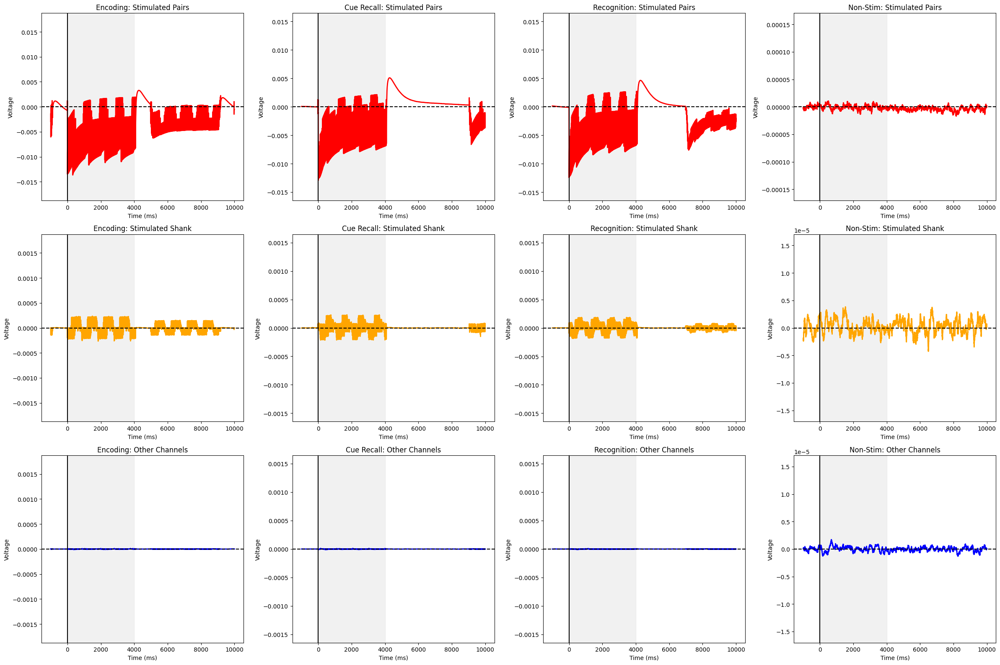

In [15]:
print("\n2.1 EEG Response for simulation Visualization")
print("-"*30)
bed_channel=[]
# Create comprehensive visualization
fig = plt.figure(figsize=(24, 16))
channel = [i for i in range(np.shape(eeg_encoding)[1]) if i not in bed_channel]

# Define stimulus period in time coordinates
stim_start_time, stim_end_time = 0, 4000  # ms

# Calculate y-axis limits from stimulated pairs for all conditions
if Contact_stimuli:
    # Get max values from stimulated pairs across all conditions
    avg_eeg_stimuli_encoding = np.mean(eeg_encoding[:, Contact_stimuli, :], axis=1)
    avg_eeg_stimuli_cue = np.mean(eeg_cue_recall[:, Contact_stimuli, :], axis=1)
    avg_eeg_stimuli_recog = np.mean(eeg_recognition[:, Contact_stimuli, :], axis=1)
    avg_eeg_stimuli_nonstim = np.mean(eeg_nonstim[:, Contact_stimuli, :], axis=1)
    
    ylim_encoding = np.max(np.abs(avg_eeg_stimuli_encoding))
    ylim_cue = np.max(np.abs(avg_eeg_stimuli_cue))
    ylim_recog = np.max(np.abs(avg_eeg_stimuli_recog))
    ylim_nonstim = np.max(np.abs(avg_eeg_stimuli_nonstim))

# Row 1: Stimulated Pairs
# Plot 1: Encoding - Stimulated Pairs
ax1 = plt.subplot(3, 4, 1)
if Contact_stimuli:
    avg_eeg_stimuli = np.mean(eeg_encoding[:, Contact_stimuli, :], axis=1)
    plt.plot(time_axis, np.mean(avg_eeg_stimuli, axis=0), linewidth=2, color='red')
    ax1.set_ylim(-ylim_encoding, ylim_encoding)
plt.axvline(x=0, color='k', linestyle='-')
plt.axhline(y=0, color='k', linestyle='--')
plt.xlabel('Time (ms)')
plt.ylabel('Voltage')
plt.title('Encoding: Stimulated Pairs')
plt.axvspan(stim_start_time, stim_end_time, alpha=0.3, color='lightgrey')

# Plot 2: Cue Recall - Stimulated Pairs
ax2 = plt.subplot(3, 4, 2)
if Contact_stimuli:
    avg_eeg_stimuli = np.mean(eeg_cue_recall[:, Contact_stimuli, :], axis=1)
    plt.plot(time_axis, np.mean(avg_eeg_stimuli, axis=0), linewidth=2, color='red')
    ax2.set_ylim(-ylim_cue, ylim_cue)
plt.axvline(x=0, color='k', linestyle='-')
plt.axhline(y=0, color='k', linestyle='--')
plt.xlabel('Time (ms)')
plt.ylabel('Voltage')
plt.title('Cue Recall: Stimulated Pairs')
plt.axvspan(stim_start_time, stim_end_time, alpha=0.3, color='lightgrey')

# Plot 3: Recognition - Stimulated Pairs
ax3 = plt.subplot(3, 4, 3)
if Contact_stimuli:
    avg_eeg_stimuli = np.mean(eeg_recognition[:, Contact_stimuli, :], axis=1)
    plt.plot(time_axis, np.mean(avg_eeg_stimuli, axis=0), linewidth=2, color='red')
    ax3.set_ylim(-ylim_recog, ylim_recog)

plt.axvline(x=0, color='k', linestyle='-')
plt.axhline(y=0, color='k', linestyle='--')
plt.xlabel('Time (ms)')
plt.ylabel('Voltage')
plt.title('Recognition: Stimulated Pairs')
plt.axvspan(stim_start_time, stim_end_time, alpha=0.3, color='lightgrey')

# Plot 4: Non-Stim - Stimulated Pairs
ax4 = plt.subplot(3, 4, 4)
if Contact_stimuli:
    avg_eeg_stimuli = np.mean(eeg_nonstim[:, Contact_stimuli, :], axis=1)
    plt.plot(time_axis, np.mean(avg_eeg_stimuli, axis=0), linewidth=2, color='red')
    ax4.set_ylim(-ylim_nonstim, ylim_nonstim)
plt.axvline(x=0, color='k', linestyle='-')
plt.axhline(y=0, color='k', linestyle='--')
plt.xlabel('Time (ms)')
plt.ylabel('Voltage')
plt.title('Non-Stim: Stimulated Pairs')
plt.axvspan(stim_start_time, stim_end_time, alpha=0.3, color='lightgrey')

# Row 2: Stimulated Shank
# Plot 5: Encoding - Stimulated Shank
ax5 = plt.subplot(3, 4, 5)
if Contact_stimuli:
    avg_eeg_channel = np.mean(eeg_encoding[:, Channel_stimuli, :], axis=1)
    plt.plot(time_axis, np.mean(avg_eeg_channel, axis=0), linewidth=2, color='orange')
    ax5.set_ylim(-ylim_encoding/10, ylim_encoding/10)
plt.axvline(x=0, color='k', linestyle='-')
plt.axhline(y=0, color='k', linestyle='--')
plt.xlabel('Time (ms)')
plt.ylabel('Voltage')
plt.title('Encoding: Stimulated Shank')
plt.axvspan(stim_start_time, stim_end_time, alpha=0.3, color='lightgrey')

# Plot 6: Cue Recall - Stimulated Shank
ax6 = plt.subplot(3, 4, 6)
if Contact_stimuli:
    avg_eeg_channel = np.mean(eeg_cue_recall[:, Channel_stimuli, :], axis=1)
    plt.plot(time_axis, np.mean(avg_eeg_channel, axis=0), linewidth=2, color='orange')
    ax6.set_ylim(-ylim_cue/10, ylim_cue/10)
plt.axvline(x=0, color='k', linestyle='-')
plt.axhline(y=0, color='k', linestyle='--')
plt.xlabel('Time (ms)')
plt.ylabel('Voltage')
plt.title('Cue Recall: Stimulated Shank')
plt.axvspan(stim_start_time, stim_end_time, alpha=0.3, color='lightgrey')

# Plot 7: Recognition - Stimulated Shank
ax7 = plt.subplot(3, 4, 7)
if Contact_stimuli:
    avg_eeg_channel = np.mean(eeg_recognition[:, Channel_stimuli, :], axis=1)
    plt.plot(time_axis, np.mean(avg_eeg_channel, axis=0), linewidth=2, color='orange')
    ax7.set_ylim(-ylim_recog/10, ylim_recog/10)
plt.axvline(x=0, color='k', linestyle='-')
plt.axhline(y=0, color='k', linestyle='--')
plt.xlabel('Time (ms)')
plt.ylabel('Voltage')
plt.title('Recognition: Stimulated Shank')
plt.axvspan(stim_start_time, stim_end_time, alpha=0.3, color='lightgrey')

# Plot 8: Non-Stim - Stimulated Shank
ax8 = plt.subplot(3, 4, 8)
if Contact_stimuli:
    avg_eeg_channel = np.mean(eeg_nonstim[:, Channel_stimuli, :], axis=1)
    plt.plot(time_axis, np.mean(avg_eeg_channel, axis=0), linewidth=2, color='orange')
    ax8.set_ylim(-ylim_nonstim/10, ylim_nonstim/10)
plt.axvline(x=0, color='k', linestyle='-')
plt.axhline(y=0, color='k', linestyle='--')
plt.xlabel('Time (ms)')
plt.ylabel('Voltage')
plt.title('Non-Stim: Stimulated Shank')
plt.axvspan(stim_start_time, stim_end_time, alpha=0.3, color='lightgrey')

# Row 3: Other Channels
# Plot 9: Encoding - Other Channels
ax9 = plt.subplot(3, 4, 9)
if Contact_stimuli:
    avg_eeg_other = np.mean(eeg_encoding[:, Index_other, :], axis=1)
    plt.plot(time_axis, np.mean(avg_eeg_other, axis=0), linewidth=2, color='blue')
    ax9.set_ylim(-ylim_encoding/10, ylim_encoding/10)
plt.axvline(x=0, color='k', linestyle='-')
plt.axhline(y=0, color='k', linestyle='--')
plt.xlabel('Time (ms)')
plt.ylabel('Voltage')
plt.title('Encoding: Other Channels')
plt.axvspan(stim_start_time, stim_end_time, alpha=0.3, color='lightgrey')

# Plot 10: Cue Recall - Other Channels
ax10 = plt.subplot(3, 4, 10)
if Contact_stimuli:
    avg_eeg_other = np.mean(eeg_cue_recall[:, Index_other, :], axis=1)
    plt.plot(time_axis, np.mean(avg_eeg_other, axis=0), linewidth=2, color='blue')
    ax10.set_ylim(-ylim_recog/10, ylim_recog/10)
plt.axvline(x=0, color='k', linestyle='-')
plt.axhline(y=0, color='k', linestyle='--')
plt.xlabel('Time (ms)')
plt.ylabel('Voltage')
plt.title('Cue Recall: Other Channels')
plt.axvspan(stim_start_time, stim_end_time, alpha=0.3, color='lightgrey')

# Plot 11: Recognition - Other Channels
ax11 = plt.subplot(3, 4, 11)
if Contact_stimuli:
    avg_eeg_other = np.mean(eeg_recognition[:, Index_other, :], axis=1)
    plt.plot(time_axis, np.mean(avg_eeg_other, axis=0), linewidth=2, color='blue')
    ax11.set_ylim(-ylim_recog/10, ylim_recog/10)
plt.axvline(x=0, color='k', linestyle='-')
plt.axhline(y=0, color='k', linestyle='--')
plt.xlabel('Time (ms)')
plt.ylabel('Voltage')
plt.title('Recognition: Other Channels')
plt.axvspan(stim_start_time, stim_end_time, alpha=0.3, color='lightgrey')

# Plot 12: Non-Stim - Other Channels
ax12 = plt.subplot(3, 4, 12)
if Contact_stimuli:
    avg_eeg_other = np.mean(eeg_nonstim[:, Index_other, :], axis=1)
    plt.plot(time_axis, np.mean(avg_eeg_other, axis=0), linewidth=2, color='blue')
    ax12.set_ylim(-ylim_nonstim/10, ylim_nonstim/10)
plt.axvline(x=0, color='k', linestyle='-')
plt.axhline(y=0, color='k', linestyle='--')
plt.xlabel('Time (ms)')
plt.ylabel('Voltage')
plt.title('Non-Stim: Other Channels')
plt.axvspan(stim_start_time, stim_end_time, alpha=0.3, color='lightgrey')

plt.tight_layout()
plt.show()


2.1 EEG Response for simulation Visualization
------------------------------
Pulse timing across trials should be consistent within ±10 ms.
Pulses are delivered at 20 ms intervals (50 Hz carrier frequency).


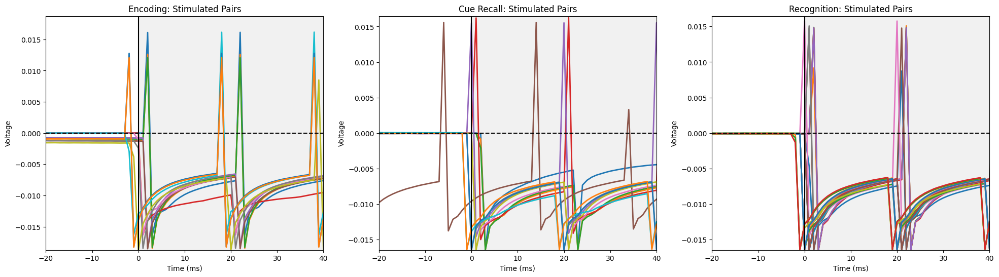

In [17]:
print("\n2.1 EEG Response for simulation Visualization")
print("-"*30)
bed_channel=[]
# Create comprehensive visualization
fig = plt.figure(figsize=(24, 6))
channel = [i for i in range(np.shape(eeg_encoding)[1]) if i not in bed_channel]

# Define stimulus period in time coordinates
stim_start_time, stim_end_time = 0, 4000  # ms

# Calculate y-axis limits from stimulated pairs for all conditions
if Contact_stimuli:
    # Get max values from stimulated pairs across all conditions
    avg_eeg_stimuli_encoding = np.mean(eeg_encoding[:, Contact_stimuli, :], axis=1)
    avg_eeg_stimuli_cue = np.mean(eeg_cue_recall[:, Contact_stimuli, :], axis=1)
    avg_eeg_stimuli_recog = np.mean(eeg_recognition[:, Contact_stimuli, :], axis=1)
    avg_eeg_stimuli_nonstim = np.mean(eeg_nonstim[:, Contact_stimuli, :], axis=1)
    
    ylim_encoding = np.max(np.abs(avg_eeg_stimuli_encoding))
    ylim_cue = np.max(np.abs(avg_eeg_stimuli_cue))
    ylim_recog = np.max(np.abs(avg_eeg_stimuli_recog))
    ylim_nonstim = np.max(np.abs(avg_eeg_stimuli_nonstim))

# Row 1: Stimulated Pairs
# Plot 1: Encoding - Stimulated Pairs
ax1 = plt.subplot(1, 3, 1)
if Contact_stimuli:
    avg_eeg_stimuli = avg_eeg_stimuli_encoding.T
    plt.plot(time_axis,avg_eeg_stimuli, linewidth=2)
    ax1.set_ylim(-ylim_encoding, ylim_encoding)
    ax1.set_xlim(-20, 40)
plt.axvline(x=0, color='k', linestyle='-')
plt.axhline(y=0, color='k', linestyle='--')
plt.xlabel('Time (ms)')
plt.ylabel('Voltage')
plt.title('Encoding: Stimulated Pairs')
plt.axvspan(stim_start_time, stim_end_time, alpha=0.3, color='lightgrey')

# Plot 2: Cue Recall - Stimulated Pairs
ax2 = plt.subplot(1, 3, 2)
if Contact_stimuli:
    avg_eeg_stimuli = avg_eeg_stimuli_cue.T
    plt.plot(time_axis, avg_eeg_stimuli, linewidth=2)
    ax2.set_ylim(-ylim_cue, ylim_cue)
    ax2.set_xlim(-20, 40)
plt.axvline(x=0, color='k', linestyle='-')
plt.axhline(y=0, color='k', linestyle='--')
plt.xlabel('Time (ms)')
plt.ylabel('Voltage')
plt.title('Cue Recall: Stimulated Pairs')
plt.axvspan(stim_start_time, stim_end_time, alpha=0.3, color='lightgrey')

# Plot 3: Recognition - Stimulated Pairs
ax3 = plt.subplot(1, 3, 3)
if Contact_stimuli:
    avg_eeg_stimuli = avg_eeg_stimuli_recog.T
    plt.plot(time_axis, avg_eeg_stimuli, linewidth=2)
    ax3.set_ylim(-ylim_recog, ylim_recog)
ax3.set_xlim(-20, 40)
plt.axvline(x=0, color='k', linestyle='-')
plt.axhline(y=0, color='k', linestyle='--')
plt.xlabel('Time (ms)')
plt.ylabel('Voltage')
plt.title('Recognition: Stimulated Pairs')
plt.axvspan(stim_start_time, stim_end_time, alpha=0.3, color='lightgrey')
print("Pulse timing across trials should be consistent within ±10 ms.")
print("Pulses are delivered at 20 ms intervals (50 Hz carrier frequency).")



Total channels analyzed: 223
Channels with high variability (|z-score| > 2): 2

Potential problematic channels:
  Channel 87: RB8-RB9 (z-score: 10.15)
  Channel 88: RB9-RB10 (z-score: 10.13)


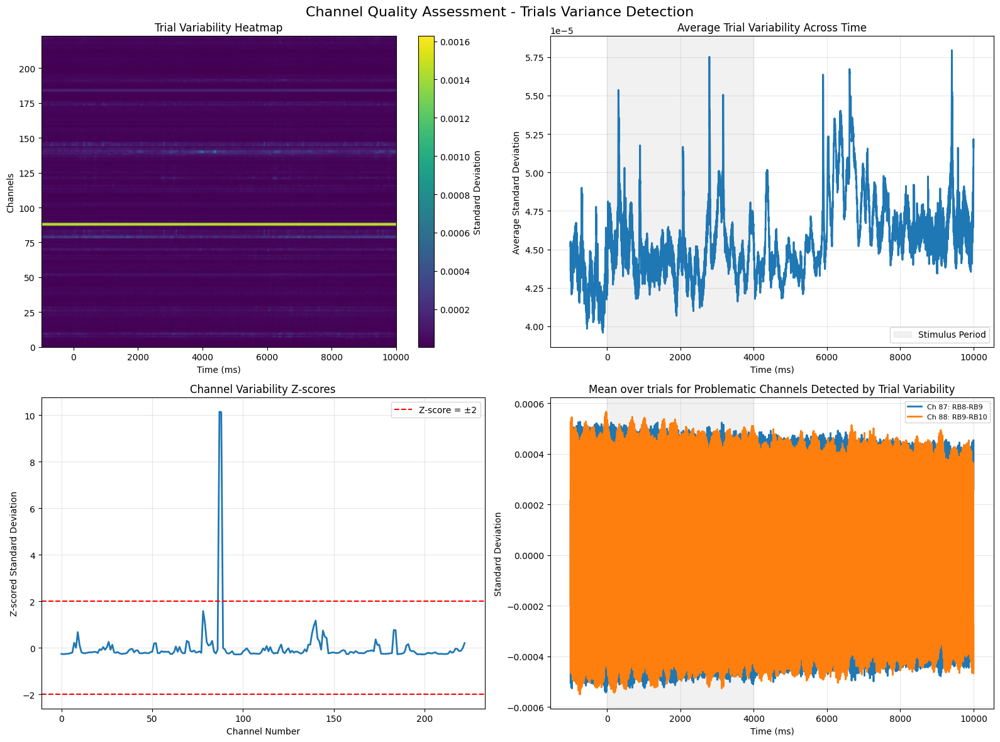

In [18]:
channel = [i for i in range(np.shape(eeg_nonstim)[1]) if i not in bed_channel]
channels =channel_info['name']
eeg_no_encoding=eeg_nonstim
trial_variability = np.std(eeg_no_encoding[:,channel, :],axis=0)  # Shape: (channels, timepoints)
timepoint_variability = np.mean(trial_variability, axis=0)  # Average over trials 
channel_variability = np.mean(trial_variability, axis=1)  #  Average over channel

# Z-score channel variability to identify outliers
channel_variability_z = zscore(channel_variability)
problematic_channels = np.where(np.abs(channel_variability_z) > 2)[0]

print(f"Total channels analyzed: {len(channels)}")
print(f"Channels with high variability (|z-score| > 2): {len(problematic_channels)}")

if len(problematic_channels) > 0:
    print("\nPotential problematic channels:")
    for ch_idx in problematic_channels:
        if ch_idx < len(channels):
            print(f"  Channel {ch_idx}: {channels.iloc[ch_idx]} (z-score: {channel_variability_z[ch_idx]:.2f})")

fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Channel Quality Assessment - Trials Variance Detection', fontsize=16)
# Heatmap of trial variability
ax1 = axes[0, 0]
im = ax1.imshow(trial_variability, aspect='auto', cmap='viridis', origin='lower',
                extent=[time_axis[0], time_axis[-1], 0, trial_variability.shape[0]])
ax1.set_xlabel('Time (ms)')
ax1.set_ylabel('Channels')
ax1.set_title('Trial Variability Heatmap')
plt.colorbar(im, ax=ax1, label='Standard Deviation')

# Average variability across time
ax2 = axes[0, 1]
ax2.plot(time_axis, timepoint_variability, linewidth=2)
ax2.set_xlabel('Time (ms)')
ax2.set_ylabel('Average Standard Deviation')
ax2.set_title('Average Trial Variability Across Time')
ax2.grid(True, alpha=0.3)
ax2.axvspan(stim_start_time, stim_end_time, alpha=0.3, color='lightgrey', label='Stimulus Period')
ax2.legend()

# Channel variability z-scores
ax3 = axes[1, 0]
ax3.plot(channel_variability_z, linewidth=2)
ax3.axhline(y=2, color='r', linestyle='--', label='Z-score = ±2')
ax3.axhline(y=-2, color='r', linestyle='--')
ax3.set_xlabel('Channel Number')
ax3.set_ylabel('Z-scored Standard Deviation')
ax3.set_title('Channel Variability Z-scores')
ax3.grid(True, alpha=0.3)
ax3.legend()
# Problematic channels over time
ax4 = axes[1, 1]
if len(problematic_channels) > 0:
    for ch in problematic_channels[:8]:  # Plot up to 8 problematic channels
        if ch < trial_variability.shape[0]:
            ax4.plot(time_axis, np.mean(eeg_no_encoding[:, ch, :], axis=0), 
                    label=f'Ch {ch}: {channels[ch] if ch < len(channels) else "Unknown"}', 
                    linewidth=2)
    ax4.set_xlabel('Time (ms)')
    ax4.set_ylabel('Standard Deviation')
    ax4.set_title('Mean over trials for Problematic Channels Detected by Trial Variability')
    ax4.grid(True, alpha=0.3)
    ax4.legend(fontsize=8)
    ax4.axvspan(stim_start_time, stim_end_time, alpha=0.3, color='lightgrey')

plt.tight_layout()
plt.show()



--------------------------------------------------
Total channels analyzed: 223
Channels with high timepoint variance (|z-score| > 2): 2

Potential Problematic Channels:
  Channel 87: RB8-RB9 (z-score: 10.52)
  Channel 88: RB9-RB10 (z-score: 10.49)


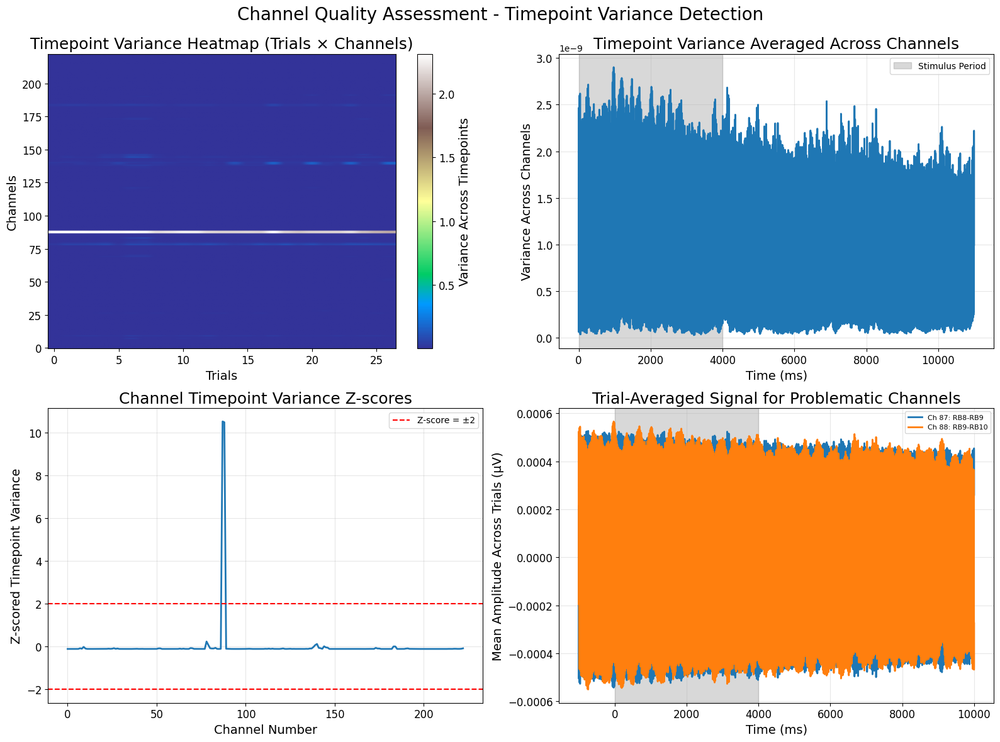

In [19]:
from scipy.stats import zscore
FONTSIZE_TITLE = 16
FONTSIZE_LABEL = 14
FONTSIZE_TICK = 12
bad_channels = []
channel = [i for i in range(np.shape(eeg_nonstim)[1]) if i not in bad_channels]
channels = channel_info['name']
eeg_no_encoding = eeg_nonstim

# =============================================================================
# Timepoint Variance Analysis
# =============================================================================
print("-" * 50)

timepoint_variance = np.var(eeg_no_encoding[:, channel, :], axis=2)  # (trials, channels)
trial_averaged_variance = np.mean(timepoint_variance, axis=0)  # (channels,)

channel_timepoint_variance = np.var(np.mean(eeg_no_encoding[:, channel, :], axis=0), axis=1)  # (channels,)
timepoint_channel_variance = np.var(np.mean(eeg_no_encoding[:, channel, :], axis=0), axis=0)  # (timepoints,)

channel_variance_z = zscore(trial_averaged_variance)
problematic_channels = np.where(np.abs(channel_variance_z) > 2)[0]
problematic_sorted = problematic_channels[np.argsort(-channel_variance_z[problematic_channels])]

print(f"Total channels analyzed: {len(channel)}")
print(f"Channels with high timepoint variance (|z-score| > 2): {len(problematic_channels)}")

if len(problematic_channels) > 0:
    print("\nPotential Problematic Channels:")
    for ch_idx in problematic_channels:
        if ch_idx < len(channels):
            print(f"  Channel {ch_idx}: {channels.iloc[ch_idx]} "
                  f"(z-score: {channel_variance_z[ch_idx]:.2f})")

# =============================================================================
# 2×2 Channel Quality Assessment — Timepoint Variance
# =============================================================================
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Channel Quality Assessment - Timepoint Variance Detection', fontsize=20)

# --- Panel 1: Heatmap of timepoint variance ---
ax1 = axes[0, 0]
im = ax1.imshow(
    timepoint_variance.T,
    aspect='auto',
    cmap='terrain',
    origin='lower',
)
ax1.set_xlabel('Trials', fontsize=FONTSIZE_LABEL)
ax1.set_ylabel('Channels', fontsize=FONTSIZE_LABEL)
ax1.set_title('Timepoint Variance Heatmap (Trials × Channels)', fontsize=18)
ax1.tick_params(axis='both', labelsize=FONTSIZE_TICK)
cbar = plt.colorbar(im, ax=ax1)
cbar.set_label('Variance Across Timepoints', fontsize=FONTSIZE_LABEL)
cbar.ax.tick_params(labelsize=FONTSIZE_TICK)
cbar.ax.yaxis.get_offset_text().set_visible(False)

# --- Panel 2: Variance across channels over time ---
ax2 = axes[0, 1]
ax2.plot(timepoint_channel_variance, linewidth=2)
ax2.set_xlabel('Time (ms)', fontsize=FONTSIZE_LABEL)
ax2.set_ylabel('Variance Across Channels', fontsize=FONTSIZE_LABEL)
ax2.set_title('Timepoint Variance Averaged Across Channels', fontsize=18)
ax2.grid(True, alpha=0.3)
ax2.axvspan(stim_start_time, stim_end_time, alpha=0.3, color='grey', label='Stimulus Period')
ax2.legend()
ax2.tick_params(axis='both', labelsize=FONTSIZE_TICK)

# --- Panel 3: Channel variance z-scores ---
ax3 = axes[1, 0]
ax3.plot(channel_variance_z, linewidth=2)
ax3.axhline(y=2, color='r', linestyle='--', label='Z-score = ±2')
ax3.axhline(y=-2, color='r', linestyle='--')
ax3.set_xlabel('Channel Number', fontsize=FONTSIZE_LABEL)
ax3.set_ylabel('Z-scored Timepoint Variance', fontsize=FONTSIZE_LABEL)
ax3.set_title('Channel Timepoint Variance Z-scores', fontsize=18)
ax3.grid(True, alpha=0.3)
ax3.legend()
ax3.tick_params(axis='both', labelsize=FONTSIZE_TICK)

# --- Panel 4: Problematic channels over time ---
ax4 = axes[1, 1]
if len(problematic_channels) > 0:
    for ch in problematic_sorted[:8]:
        if ch < len(channels):
            channel_signal = np.mean(eeg_no_encoding[:, ch, :], axis=0)
            ax4.plot(time_axis, channel_signal,
                     label=f'Ch {ch}: {channels.iloc[ch]}',
                     linewidth=2)
    ax4.set_xlabel('Time (ms)', fontsize=FONTSIZE_LABEL)
    ax4.set_ylabel('Mean Amplitude Across Trials (µV)', fontsize=FONTSIZE_LABEL)
    ax4.set_title('Trial-Averaged Signal for Problematic Channels', fontsize=18)
    ax4.grid(True, alpha=0.3)
    ax4.legend(fontsize=8)
    ax4.axvspan(stim_start_time, stim_end_time, alpha=0.3, color='grey')
    ax4.tick_params(axis='both', labelsize=FONTSIZE_TICK)
else:
    ax4.text(0.5, 0.5, 'No problematic channels detected',
             ha='center', va='center', transform=ax4.transAxes, fontsize=FONTSIZE_LABEL)
    ax4.set_title('Trial-Averaged Signal for Problematic Channels', fontsize=18)

plt.tight_layout()

plt.show()

In [31]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import zscore

mean_data = np.mean(eeg_no_encoding, axis=0)

# --- Compute both variance metrics ---
trial_std = np.std(eeg_no_encoding, axis=0)
channel_trial_var = np.mean(trial_std, axis=1)
trial_variance_z = zscore(channel_trial_var)
problematic_trial = set(np.where(np.abs(trial_variance_z) > 2)[0])

timepoint_var = np.var(eeg_no_encoding, axis=2)
channel_tp_var = np.mean(timepoint_var, axis=0)
timepoint_variance_z = zscore(channel_tp_var)
problematic_timepoint = set(np.where(np.abs(timepoint_variance_z) > 2)[0])

problematic_both = problematic_trial & problematic_timepoint
problematic_trial_only = problematic_trial - problematic_timepoint
problematic_timepoint_only = problematic_timepoint - problematic_trial

print(f"Channels flagged by trial variance only in orange:     {sorted(problematic_trial_only)}")
print(f"Channels flagged by timepoint variance only in blue:  {sorted(problematic_timepoint_only)}")
print(f"Channels flagged by BOTH in red:                     {sorted(problematic_both)}")

# --- Plot all channels (large subplots) ---
n_channels = mean_data.shape[0]
n_cols = 4
n_rows = int(np.ceil(n_channels / n_cols))

fig, axes = plt.subplots(n_rows, n_cols,
                         figsize=(n_cols * 10, n_rows * 6),
                         constrained_layout=True)
fig.suptitle('All Channels — Mean Across Trials (Red = Both, '
             'Orange = Trial Var, Blue = Timepoint Var)', fontsize=24, y=1.01)

axes = axes.flatten()
y_max = np.max(np.abs(mean_data)) * 1.05  # 5% padding

for ch in range(n_channels):
    ax = axes[ch]

    if ch in problematic_both:
        line_color = 'red'
        flag = ' [BOTH]'
    elif ch in problematic_trial_only:
        line_color = 'orange'
        flag = ' [TRIAL]'
    elif ch in problematic_timepoint_only:
        line_color = '#1E90FF'
        flag = ' [TIMEPOINT]'
    else:
        line_color = 'k'
        flag = ''

    ax.plot(time_axis, mean_data[ch, :], linewidth=1.2, color=line_color)
    ax.set_title(f'{channels.iloc[ch]}{flag}', fontsize=18,
                 color=line_color, fontweight='bold' if flag else 'normal')
    ax.set_xlabel('Time (ms)', fontsize=14)
    ax.set_ylabel('Amplitude (µV)', fontsize=14)
    ax.tick_params(labelsize=13)
    ax.spines[['top', 'right']].set_visible(False)
    ax.set_ylim(-y_max, y_max)

for i in range(n_channels, len(axes)):
    axes[i].set_visible(False)

plt.show()

Channels flagged by trial variance only in orange:     []
Channels flagged by timepoint variance only in blue:  []
Channels flagged by BOTH in red:                     [np.int64(87), np.int64(88)]


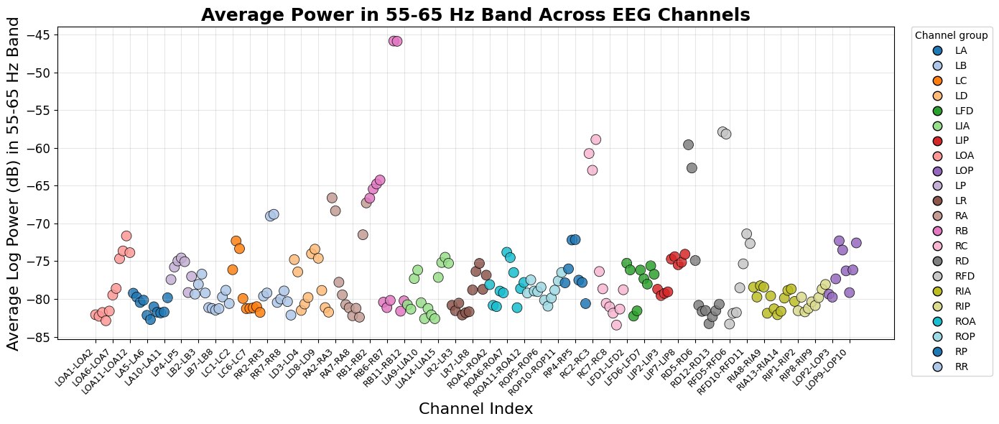

55-65 Hz Band Power Summary:
Mean: -77.4862 dB
Std Dev: 5.7050 dB
Min: -83.4575 dB (Channel 152)
Max: -45.8398 dB (Channel 87)


In [52]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.fft import fft, fftfreq
import re

# ----------------------------
# Compute mean and FFT parameters
# ----------------------------
mean_data = np.mean(eeg_nonstim, axis=0)  # (n_channels, n_samples)
sampling_rate = 1000  # Hz
n_samples = mean_data.shape[1]

freqs = fftfreq(n_samples, 1/sampling_rate)[:n_samples//2]
freq_min, freq_max = 55, 65
freq_mask = (freqs >= freq_min) & (freqs <= freq_max)

n_channels = mean_data.shape[0]

# ----------------------------
# Extract average power in 55-65 Hz band for each channel
# ----------------------------
band_powers = []
for ch in range(n_channels):
    fft_data = fft(mean_data[ch, :])
    power_spectrum = np.abs(fft_data[:n_samples//2])**2
    log_power = 10 * np.log10(power_spectrum + 1e-12)
    band_powers.append(np.mean(log_power[freq_mask]))

band_powers = np.array(band_powers)

# ----------------------------
# Group channels by prefix (LOA, LAP, etc.) and assign colors
# ----------------------------


channel_names = [str(x) for x in channels]


def channel_group(name: str) -> str:
    first = name.split("-")[0]          # "LA1" from "LA1-LA2"
    grp = re.sub(r"\d+$", "", first)    # remove trailing digits -> "LA"
    return grp if grp else first

groups = np.array([channel_group(n) for n in channel_names])
unique_groups = sorted(np.unique(groups))

# pick a categorical colormap with many distinct colors
cmap = plt.get_cmap("tab20")  # try "tab10" if you have <=10 groups
group_to_color = {g: cmap(i % cmap.N) for i, g in enumerate(unique_groups)}
point_colors = [group_to_color[g] for g in groups]

# ----------------------------
# Plot
# ----------------------------
fig, ax = plt.subplots(figsize=(14, 6))
x = np.arange(n_channels)

ax.scatter(
    x, band_powers,
    s=100, alpha=0.85,
    c=point_colors,
    edgecolors="black", linewidth=0.6
)

ax.set_xlabel("Channel Index", fontsize=16)
ax.set_ylabel("Average Log Power (dB) in 55-65 Hz Band", fontsize=16)
ax.set_title("Average Power in 55-65 Hz Band Across EEG Channels", fontsize=18, fontweight="bold")
ax.grid(True, alpha=0.3)
ax.tick_params(axis="x", labelsize=12)
ax.tick_params(axis="y", labelsize=12)

# Optional: show some x tick labels
ax.set_xticks(x[::5])
ax.set_xticklabels([channel_names[i] for i in x[::5]], rotation=45, ha="right", fontsize=9)

# Legend (one entry per group)
handles = [
    plt.Line2D([0], [0], marker="o", color="w",
               markerfacecolor=group_to_color[g],
               markeredgecolor="black",
               markersize=9, label=g)
    for g in unique_groups
]
ax.legend(handles=handles, title="Channel group", bbox_to_anchor=(1.02, 1), loc="upper left", borderaxespad=0)

plt.tight_layout()
plt.show()

# Summary stats
print("55-65 Hz Band Power Summary:")
print(f"Mean: {np.mean(band_powers):.4f} dB")
print(f"Std Dev: {np.std(band_powers):.4f} dB")
print(f"Min: {np.min(band_powers):.4f} dB (Channel {np.argmin(band_powers)})")
print(f"Max: {np.max(band_powers):.4f} dB (Channel {np.argmax(band_powers)})")


In [ ]:
# Calculate z-scores
z_scores = (band_powers - np.mean(band_powers)) / np.std(band_powers)

# Print channels with z-score < -2
print("\n" + "="*80)
print("Channels with Z-score >2 (2 standard deviations below mean):")
print("="*80)

low_power_channels = [
    (channel_names[i], band_powers[i], z_scores[i])
    for i in range(n_channels)
    if z_scores[i] >2
]

if low_power_channels:
    # Sort from lowest z-score (most extreme) upward
    for ch_name, power, z_score in sorted(low_power_channels, key=lambda x: x[2]):
        print(f"  {ch_name:15s} | Power: {power:8.4f} dB | Z-score: {z_score:6.4f}")
else:
    print("  No channels found with Z-score < -2")

# Print all channels sorted by power
print("\n" + "="*80)
print("All Channel Powers (sorted by power):")
print("="*80)

sorted_indices = np.argsort(band_powers)[::-1]

for idx in sorted_indices:
    ch_name = channel_names[idx]
    power = band_powers[idx]
    z_score = z_scores[idx]
    marker = " ← Z < -2" if z_score < -2 else ""
    print(f"  {ch_name:15s} | Power: {power:8.4f} dB | Z-score: {z_score:6.4f}{marker}")

problematic_channels =set(
    i for i in range(n_channels) if z_scores[i] > 2
)



n_channels = mean_data.shape[0]
n_cols = 4
n_rows = int(np.ceil(n_channels / n_cols))

fig, axes = plt.subplots(n_rows, n_cols,
                         figsize=(n_cols * 10, n_rows * 6),
                         constrained_layout=True)
fig.suptitle('FFT Power Spectrum — Mean Across Trials (Red = |Z| > 2)',
             fontsize=FONTSIZE_TITLE, y=1.01)
freq_mask = freqs <= 100
global_y_max = 0
for ch in range(n_channels):
    fft_data = fft(mean_data[ch, :])
    power_spectrum = np.abs(fft_data[:n_samples // 2]) ** 2
    global_y_max = max(global_y_max, np.max(power_spectrum[freq_mask]))
global_y_max *= 1.05  # 5% padding
axes = axes.flatten()

for channel in range(n_channels):
    ax = axes[channel]

    fft_data = fft(mean_data[channel, :])
    power_spectrum = np.abs(fft_data[:n_samples // 2]) ** 2

    if channel in problematic_channels:
        line_color = 'red'
        flag = f' [Z={z_scores[channel]:.2f}]'
    else:
        line_color = 'k'
        flag = ''

    ax.plot(freqs, power_spectrum, linewidth=0.8, color=line_color)
    ax.set_title(f'{channels.iloc[channel]}{flag}', fontsize=FONTSIZE_LABEL,
                 color=line_color, fontweight='bold' if flag else 'normal')
    ax.set_xlabel('Frequency (Hz)', fontsize=FONTSIZE_LABEL)
    ax.set_ylabel('Power', fontsize=FONTSIZE_LABEL)
    ax.tick_params(labelsize=FONTSIZE_TICK)
    ax.spines[['top', 'right']].set_visible(False)
    ax.set_xlim(0, 100)
    
for i in range(n_channels, len(axes)):
    axes[i].set_visible(False)


plt.show()


Channels with Z-score >2 (2 standard deviations below mean):
  RB2-RB3         | Power: -65.4476 dB | Z-score: 2.1102
  RB3-RB4         | Power: -64.7709 dB | Z-score: 2.2288
  RB4-RB5         | Power: -64.2560 dB | Z-score: 2.3191
  RC2-RC3         | Power: -62.9571 dB | Z-score: 2.5467
  RD2-RD3         | Power: -62.6552 dB | Z-score: 2.5996
  RC1-RC2         | Power: -60.7331 dB | Z-score: 2.9366
  RD1-RD2         | Power: -59.5744 dB | Z-score: 3.1397
  RC3-RC4         | Power: -58.8869 dB | Z-score: 3.2602
  RFD2-RFD3       | Power: -58.1653 dB | Z-score: 3.3866
  RFD1-RFD2       | Power: -57.8683 dB | Z-score: 3.4387
  RB9-RB10        | Power: -45.8742 dB | Z-score: 5.5411
  RB8-RB9         | Power: -45.8398 dB | Z-score: 5.5471

All Channel Powers (sorted by power):
  RB8-RB9         | Power: -45.8398 dB | Z-score: 5.5471
  RB9-RB10        | Power: -45.8742 dB | Z-score: 5.5411
  RFD1-RFD2       | Power: -57.8683 dB | Z-score: 3.4387
  RFD2-RFD3       | Power: -58.1653 dB | Z-s

In [56]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.fft import fft, fftfreq
from scipy.stats import zscore





In [55]:
low_power_channels

[('RB2-RB3', np.float64(-65.44762061623123), np.float64(2.110177079379686)),
 ('RB3-RB4', np.float64(-64.77089621291648), np.float64(2.228796114939865)),
 ('RB4-RB5', np.float64(-64.25596519603268), np.float64(2.319055340561983)),
 ('RB8-RB9', np.float64(-45.83982376276005), np.float64(5.547112323366866)),
 ('RB9-RB10', np.float64(-45.87423849677583), np.float64(5.541079967302837)),
 ('RC1-RC2', np.float64(-60.73310164121934), np.float64(2.9365573476348708)),
 ('RC2-RC3', np.float64(-62.95706279004313), np.float64(2.546732294327184)),
 ('RC3-RC4', np.float64(-58.88694412085961), np.float64(3.2601594277203274)),
 ('RD1-RD2', np.float64(-59.574395462653385), np.float64(3.1396601302829903)),
 ('RD2-RD3', np.float64(-62.65517388518291), np.float64(2.599648622695769)),
 ('RFD1-RFD2', np.float64(-57.86826628980675), np.float64(3.438717465932264)),
 ('RFD2-RFD3', np.float64(-58.16531481798003), np.float64(3.386649578689106))]